In [1]:

import os
import json
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import torch
import random
import numpy as np
import seaborn as sns
from torchvision import models
from torchvision.models import resnet18, ResNet18_Weights
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, confusion_matrix

from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from lime import lime_image
from skimage.segmentation import mark_boundaries
from collections import OrderedDict


In [2]:
class CassavaDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["image_id"])
        image = Image.open(img_path).convert("RGB")
        label = int(row["label"])
        if self.transform:
            image = self.transform(image)
        return image, label


class CassavaDataModule(pl.LightningDataModule):
    def __init__(self, data_dir, csv_path, json_path, transform, batch_size=64, num_workers=2):
        super().__init__()
        self.data_dir = data_dir
        self.csv_path = csv_path
        self.json_path = json_path
        self.batch_size = batch_size
        self.num_workers = num_workers

        # Transforms (standard ImageNet normalization)
        self.val_transform = transforms.Compose([
            transforms.Resize(256),               # Resize smaller edge to 256 (keeps aspect ratio)
            transforms.CenterCrop(224),           # Crop the center 224x224 region
            transforms.ToTensor(),                # Convert to tensor (HWC → CHW, scales to [0,1])
            transforms.Normalize(                 # Normalize with ImageNet mean and std
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])

        self.train_transform = transform


    def setup(self, stage=None):
        # Load metadata
        df = pd.read_csv(self.csv_path)
        with open(self.json_path, "r") as f:
            self.class_mapping = json.load(f)

        # Split according to 'set' column
        train_df = df[df["set"] == "train"]
        val_df = df[df["set"] == "val"]
        test_df = df[df["set"] == "test"]

        # Create datasets
        self.train_ds = CassavaDataset(train_df, os.path.join(self.data_dir, "images"), transform=self.train_transform)
        self.val_ds = CassavaDataset(val_df, os.path.join(self.data_dir, "images"), transform=self.val_transform)
        self.test_ds = CassavaDataset(test_df, os.path.join(self.data_dir, "images"), transform=self.val_transform)

    def train_dataloader(self):
        return DataLoader(self.train_ds, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers)

    def val_dataloader(self):
        return DataLoader(self.val_ds, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers)

    def test_dataloader(self):
        return DataLoader(self.test_ds, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers)


In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchmetrics
import pytorch_lightning as pl


class LightningModule(pl.LightningModule):
    def __init__(self, model, lr=1e-3, wd=0.):
        super().__init__()
        self.model = model
        self.lr = lr
        self.wd = wd

        # TorchMetrics solo funciona con etiquetas enteras, así que
        # guardamos también una métrica manual cuando haya MixUp/CutMix
        self.train_acc_metric = torchmetrics.classification.Accuracy(
            task="multiclass", num_classes=5
        )
        self.val_acc_metric = torchmetrics.classification.Accuracy(
            task="multiclass", num_classes=5
        )

    # ==========================================================
    #  Forward
    # ==========================================================
    def forward(self, x):
        return self.model(x)

    # ==========================================================
    #  Optimizer
    # ==========================================================
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.wd)

    # ==========================================================
    #  Training step (compatible con MixUp / CutMix)
    # ==========================================================
    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)

        # --- Caso MixUp/CutMix: etiquetas one-hot o soft ---
        if y.ndim == 2:
            # Cross-entropy “soft”: -sum(y * log_softmax)
            loss = torch.sum(-y * F.log_softmax(logits, dim=1), dim=1).mean()

            # Accuracy: comparar predicciones con argmax de las etiquetas soft
            preds = torch.argmax(logits, dim=1)
            acc = (preds == torch.argmax(y, dim=1)).float().mean()
        else:
            # --- Caso normal ---
            loss = F.cross_entropy(logits, y)
            preds = torch.argmax(logits, dim=1)
            acc = self.train_acc_metric(preds, y)

        self.log('train_loss', loss, on_step=False, on_epoch=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    # ==========================================================
    #  Validation step (compatible con MixUp / CutMix)
    # ==========================================================
    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)

        if y.ndim == 2:
            loss = torch.sum(-y * F.log_softmax(logits, dim=1), dim=1).mean()
            preds = torch.argmax(logits, dim=1)
            acc = (preds == torch.argmax(y, dim=1)).float().mean()
        else:
            loss = F.cross_entropy(logits, y)
            preds = torch.argmax(logits, dim=1)
            acc = self.val_acc_metric(preds, y)

        self.log('val_loss', loss, on_step=False, on_epoch=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss



--- Analysis for 4222242.jpg ---
Actual Label:    Cassava Mosaic Disease (CMD)
Model Predicted: Cassava Mosaic Disease (CMD) (99.81%)
Generating explanation...


  0%|          | 0/1000 [00:00<?, ?it/s]

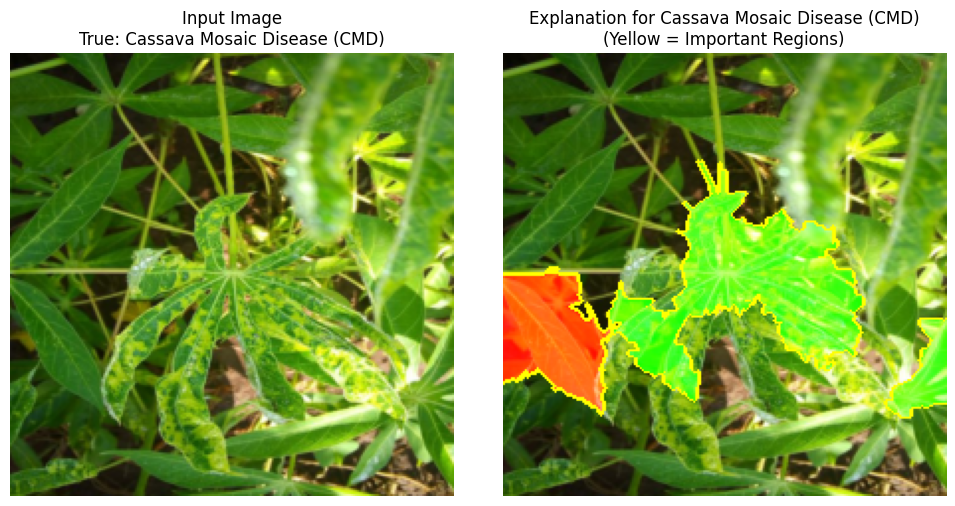

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

idx2label = {
    0: 'Cassava Bacterial Blight (CBB)',
    1: 'Cassava Brown Streak Disease (CBSD)',
    2: 'Cassava Green Mottle (CGM)',
    3: 'Cassava Mosaic Disease (CMD)',
    4: 'Healthy'
}

model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
num_in_feat = model.fc.in_features
model.fc = nn.Linear(num_in_feat, 5)

lightning_module = LightningModule.load_from_checkpoint(
    "transforms_combined_version_2/logs_transform_geometric/version_1/step2_transform_geometric.ckpt",
    model=model
)

model = lightning_module.model
model.eval().cuda()

def get_pil_transform(): 
    return transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])    

def get_preprocess_transform():
    return transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])    

pil_transform = get_pil_transform()
preprocess_transform = get_preprocess_transform()


def batch_predict(images):
    model.eval()
    batch_tensors = []
    
    for img_array in images:
        pil_img = Image.fromarray(img_array.astype('uint8'))
        tensor_img = preprocess_transform(pil_img)
        batch_tensors.append(tensor_img)
        
    batch = torch.stack(batch_tensors, dim=0).to(device)
    
    with torch.no_grad():
        logits = model(batch)
        probs = F.softmax(logits, dim=1)
        
    return probs.detach().cpu().numpy()

def explain_image(image_path, actual_label_idx=None):
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    original_img = Image.open(image_path).convert('RGB')
    lime_input_image = np.array(pil_transform(original_img))

    probs = batch_predict([lime_input_image])
    pred_idx = np.argmax(probs)
    confidence = probs[0, pred_idx]
    
    print(f"\n--- Analysis for {os.path.basename(image_path)} ---")
    print(f"Actual Label:    {idx2label.get(actual_label_idx, 'Unknown')}")
    print(f"Model Predicted: {idx2label[pred_idx]} ({confidence:.2%})")

    explainer = lime_image.LimeImageExplainer()
    print("Generating explanation...")
    explanation = explainer.explain_instance(
        lime_input_image, 
        batch_predict, 
        top_labels=5, 
        hide_color=0, 
        num_samples=1000
    )

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    
    ax1.imshow(lime_input_image)
    ax1.set_title(f"Input Image\nTrue: {idx2label.get(actual_label_idx, '?')}")
    ax1.axis('off')
    
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=False, 
        num_features=5, 
        hide_rest=False
    )
    img_boundary = mark_boundaries(temp / 255.0, mask)
    ax2.imshow(img_boundary)
    ax2.set_title(f"Explanation for {idx2label[pred_idx]}\n(Yellow = Important Regions)")
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()


explain_image("cassava/images/4222242.jpg", actual_label_idx=3) 

# explain_image("cassava/images/1000201771.jpg", actual_label_idx=0)

Generating LIME for class 0: Cassava Bacterial Blight (CBB)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 1: Cassava Brown Streak Disease (CBSD)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 2: Cassava Green Mottle (CGM)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 3: Cassava Mosaic Disease (CMD)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 4: Healthy...


  0%|          | 0/500 [00:00<?, ?it/s]

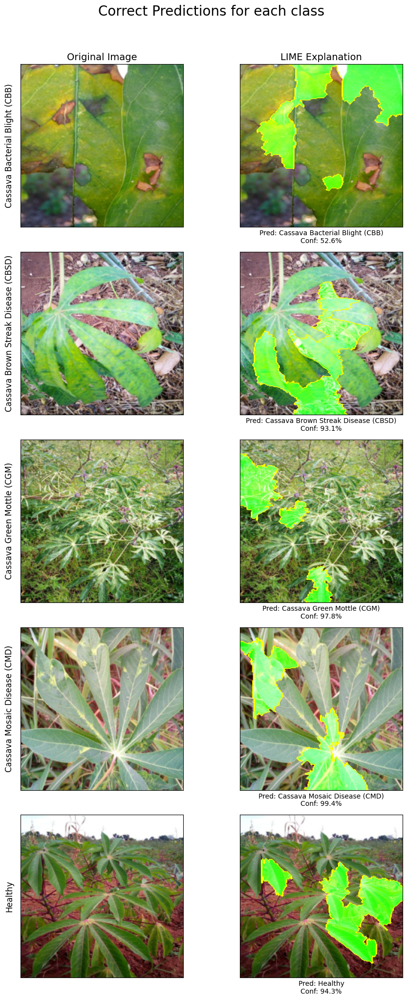

Generating LIME for class 0: Cassava Bacterial Blight (CBB)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 1: Cassava Brown Streak Disease (CBSD)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 2: Cassava Green Mottle (CGM)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 3: Cassava Mosaic Disease (CMD)...


  0%|          | 0/500 [00:00<?, ?it/s]

Generating LIME for class 4: Healthy...


  0%|          | 0/500 [00:00<?, ?it/s]

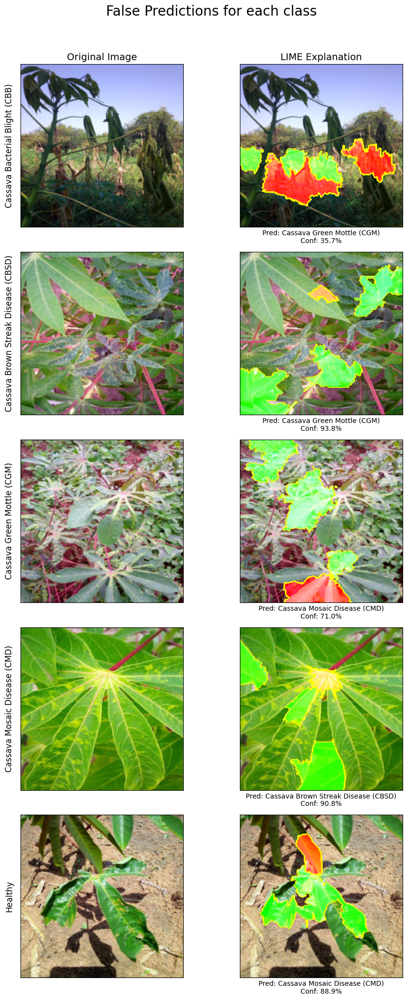

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import torch
import torch.nn.functional as F
from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries


def find_examples_per_class(csv_path, img_dir, model, transform, batch_predict_fn):

    df = pd.read_csv(csv_path)
    if 'set' in df.columns:
        df = df[df["set"] == "val"]
    
    df = df.sample(frac=1, random_state=42).reset_index(drop=True)
    
    correct_examples = {}
    incorrect_examples = {}

        
    for _, row in df.iterrows():
        if len(correct_examples) == 5 and len(incorrect_examples) == 5:
            break
            
        img_id = row["image_id"]
        true_label = int(row["label"])
        img_path = os.path.join(img_dir, img_id)
        
        if not os.path.exists(img_path): continue
        
        needs_correct = true_label not in correct_examples
        needs_incorrect = true_label not in incorrect_examples
        
        if not needs_correct and not needs_incorrect:
            continue

        try:
            img = Image.open(img_path).convert('RGB')
            input_array = np.array(transform(img))
            
            probs = batch_predict_fn([input_array])
            pred_label = np.argmax(probs)
            
            if pred_label == true_label and needs_correct:
                correct_examples[true_label] = img_path
            elif pred_label != true_label and needs_incorrect:
                incorrect_examples[true_label] = img_path
                
        except Exception as e:
            continue
            
    return correct_examples, incorrect_examples


def plot_grid_lime(examples_dict, title_main, batch_predict_fn, pil_transform):
    fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))
    fig.suptitle(title_main, fontsize=20, y=1.02)
    
    explainer = lime_image.LimeImageExplainer()
    
    for class_idx in range(5):
        ax_orig = axes[class_idx, 0]
        ax_lime = axes[class_idx, 1]
        
        img_path = examples_dict.get(class_idx)
        class_name = idx2label[class_idx]
        
        if not img_path:
            ax_orig.text(0.5, 0.5, "No example found", ha='center')
            ax_orig.axis('off')
            ax_lime.axis('off')
            continue
            
        img = Image.open(img_path).convert('RGB')
        img_lime_input = np.array(pil_transform(img))
        
        probs = batch_predict_fn([img_lime_input])
        pred_idx = np.argmax(probs)
        confidence = probs[0, pred_idx]
        pred_name = idx2label[pred_idx]
        
        print(f"Generating LIME for class {class_idx}: {class_name}...")
        explanation = explainer.explain_instance(
            img_lime_input, 
            batch_predict_fn, 
            top_labels=5, 
            hide_color=0, 
            num_samples=500
        )
        
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], 
            positive_only=False, 
            num_features=5, 
            hide_rest=False
        )
        img_boundary = mark_boundaries(temp / 255.0, mask)
        
    
        ax_orig.imshow(img_lime_input)
        if class_idx == 0: ax_orig.set_title("Original Image", fontsize=14)
        ax_orig.set_ylabel(f"{class_name}", fontsize=12, rotation=90, labelpad=10)
        ax_orig.set_xticks([])
        ax_orig.set_yticks([])
        
        ax_lime.imshow(img_boundary)
        if class_idx == 0: ax_lime.set_title("LIME Explanation", fontsize=14)
        ax_lime.set_xlabel(f"Pred: {pred_name}\nConf: {confidence:.1%}", fontsize=10)
        ax_lime.set_xticks([])
        ax_lime.set_yticks([])

    plt.tight_layout()
    plt.show()

corrects, incorrects = find_examples_per_class(
    "cassava/cassava_split.csv", 
    "cassava/images", 
    model, 
    pil_transform, 
    batch_predict
)

plot_grid_lime(corrects, "Correct Predictions for each class", batch_predict, pil_transform)

plot_grid_lime(incorrects, "False Predictions for each class", batch_predict, pil_transform)

[1/10] Explaining: 3842462434.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[2/10] Explaining: 4183312671.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[3/10] Explaining: 2380213593.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[4/10] Explaining: 3706807921.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[5/10] Explaining: 1351433725.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[6/10] Explaining: 1976698452.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[7/10] Explaining: 3458185025.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[8/10] Explaining: 2917507472.jpg (100.00%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[9/10] Explaining: 3112835749.jpg (99.99%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[10/10] Explaining: 4130203885.jpg (99.99%)...


  0%|          | 0/500 [00:00<?, ?it/s]

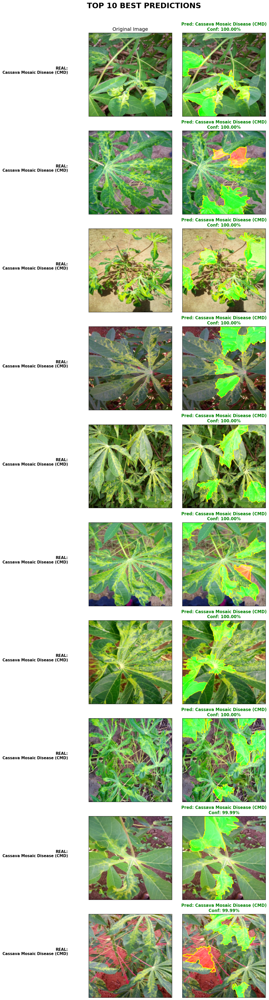

[1/10] Explaining: 2784994584.jpg (99.92%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[2/10] Explaining: 3822534983.jpg (99.89%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[3/10] Explaining: 2703905057.jpg (99.88%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[4/10] Explaining: 4196856438.jpg (99.86%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[5/10] Explaining: 1654084150.jpg (99.81%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[6/10] Explaining: 3722626623.jpg (99.57%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[7/10] Explaining: 2421584728.jpg (99.22%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[8/10] Explaining: 3954387963.jpg (99.14%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[9/10] Explaining: 3085440105.jpg (99.03%)...


  0%|          | 0/500 [00:00<?, ?it/s]

[10/10] Explaining: 3773447905.jpg (99.02%)...


  0%|          | 0/500 [00:00<?, ?it/s]

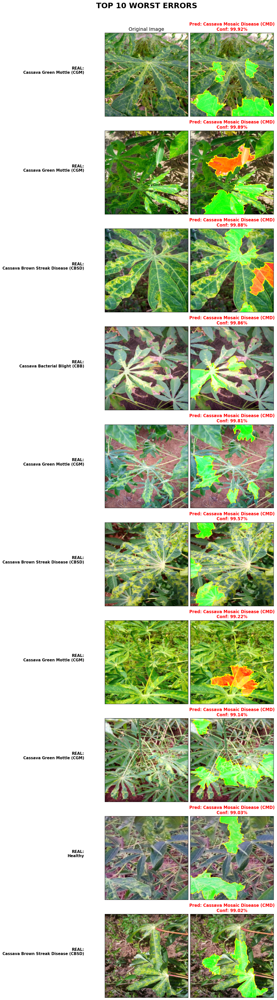

In [6]:
import pandas as pd
import numpy as np
import os
from tqdm import tqdm

def get_validation_metrics(csv_path, img_dir, transform, batch_predict_fn):
    df = pd.read_csv(csv_path)
    if 'set' in df.columns:
        val_df = df[df["set"] == "val"].reset_index(drop=True)
    else:
        val_df = df
    
    correct_preds = []
    incorrect_preds = []
        
    for idx, row in val_df.iterrows():
        img_id = row["image_id"]
        true_label = int(row["label"])
        img_path = os.path.join(img_dir, img_id)
        
        if not os.path.exists(img_path): continue

        try:
            img = Image.open(img_path).convert('RGB')
            input_array = np.array(transform(img))
            
            probs = batch_predict_fn([input_array])
            pred_label = np.argmax(probs)
            confidence = probs[0, pred_label]
            
            record = {
                "path": img_path,
                "true_label": true_label,
                "pred_label": pred_label,
                "confidence": confidence
            }
            
            if pred_label == true_label:
                correct_preds.append(record)
            else:
                incorrect_preds.append(record)
                
        except Exception as e:
            continue
            
    correct_preds.sort(key=lambda x: x["confidence"], reverse=True)
    incorrect_preds.sort(key=lambda x: x["confidence"], reverse=True)
    
    return correct_preds, incorrect_preds


def plot_top_k_lime(records_list, title_main, k=10):

    top_records = records_list[:k]
    
    if len(top_records) == 0:
        print(f"No records for: {title_main}")
        return

    fig, axes = plt.subplots(nrows=k, ncols=2, figsize=(12, 4 * k))
    fig.suptitle(title_main, fontsize=22, y=1.005, weight='bold')
    
    explainer = lime_image.LimeImageExplainer()
    
    for i, rec in enumerate(top_records):
        ax_orig = axes[i, 0]
        ax_lime = axes[i, 1]
        
        img_path = rec["path"]
        true_lbl = idx2label[rec["true_label"]]
        pred_lbl = idx2label[rec["pred_label"]]
        conf = rec["confidence"]
        
        img = Image.open(img_path).convert('RGB')
        img_lime_input = np.array(pil_transform(img))
        
        print(f"[{i+1}/{k}] Explaining: {os.path.basename(img_path)} ({conf:.2%})...")
        explanation = explainer.explain_instance(
            img_lime_input, 
            batch_predict, 
            top_labels=5, 
            hide_color=0, 
            num_samples=500
        )
        
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], 
            positive_only=False, 
            num_features=5, 
            hide_rest=False
        )
        img_boundary = mark_boundaries(temp / 255.0, mask)
        
        ax_orig.imshow(img_lime_input)
        ax_orig.set_ylabel(f"REAL:\n{true_lbl}", fontsize=11, rotation=0, labelpad=60, ha='right', weight='bold')
        ax_orig.set_xticks([])
        ax_orig.set_yticks([])
        if i == 0: ax_orig.set_title("Original Image", fontsize=14)
        
        ax_lime.imshow(img_boundary)
        
        title_color = 'green' if rec["true_label"] == rec["pred_label"] else 'red'
        ax_lime.set_title(f"Pred: {pred_lbl}\nConf: {conf:.2%}", fontsize=12, color=title_color, weight='bold')
        ax_lime.set_xticks([])
        ax_lime.set_yticks([])

    plt.tight_layout()
    plt.show()


corrects, incorrects = get_validation_metrics(
    "cassava/cassava_split.csv", 
    "cassava/images", 
    pil_transform, 
    batch_predict
)

plot_top_k_lime(corrects, "TOP 10 BEST PREDICTIONS", k=10)

plot_top_k_lime(incorrects, "TOP 10 WORST ERRORS ", k=10)


 We found 128 sick plants classified as Healthy.
[1/5] Analysing error: It was actually Cassava Bacterial Blight (CBB)...


  0%|          | 0/500 [00:00<?, ?it/s]

[2/5] Analysing error: It was actually Cassava Green Mottle (CGM)...


  0%|          | 0/500 [00:00<?, ?it/s]

[3/5] Analysing error: It was actually Cassava Mosaic Disease (CMD)...


  0%|          | 0/500 [00:00<?, ?it/s]

[4/5] Analysing error: It was actually Cassava Green Mottle (CGM)...


  0%|          | 0/500 [00:00<?, ?it/s]

[5/5] Analysing error: It was actually Cassava Mosaic Disease (CMD)...


  0%|          | 0/500 [00:00<?, ?it/s]

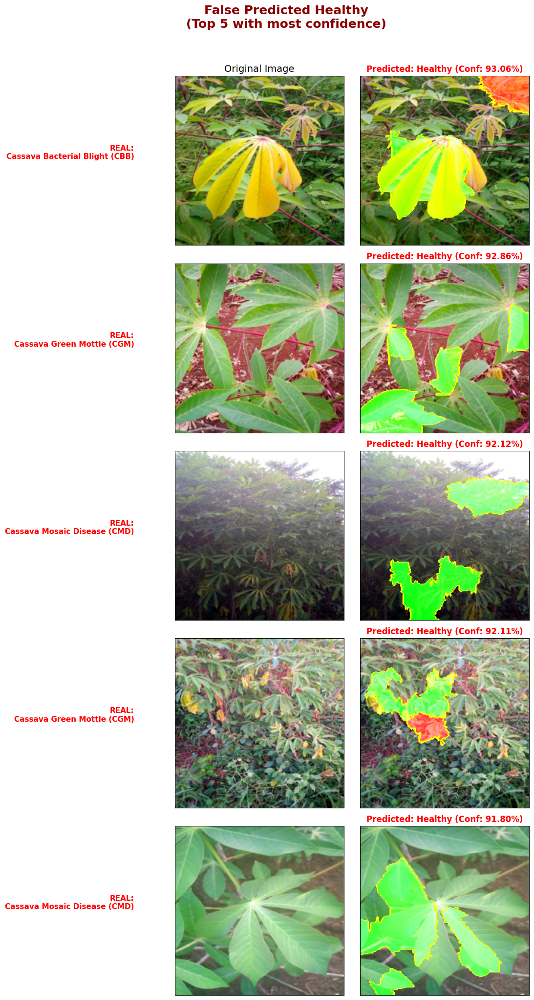

In [7]:
def find_false_healthy(csv_path, img_dir, transform, batch_predict_fn):
    df = pd.read_csv(csv_path)
    if 'set' in df.columns:
        val_df = df[df["set"] == "val"].reset_index(drop=True)
    else:
        val_df = df
    
    false_healthy_list = []
        
    for idx, row in val_df.iterrows():
        img_id = row["image_id"]
        true_label = int(row["label"])
        img_path = os.path.join(img_dir, img_id)
        
        if not os.path.exists(img_path): continue

        try:
            img = Image.open(img_path).convert('RGB')
            input_array = np.array(transform(img))
            
            probs = batch_predict_fn([input_array])
            pred_label = np.argmax(probs)
            confidence = probs[0, pred_label]
            
            if pred_label == 4 and true_label != 4:
                false_healthy_list.append({
                    "path": img_path,
                    "true_label": true_label,
                    "pred_label": pred_label,
                    "confidence": confidence
                })
                
        except Exception as e:
            continue
            
    false_healthy_list.sort(key=lambda x: x["confidence"], reverse=True)
    
    return false_healthy_list


def plot_false_healthy(records_list, k=5):

    if len(records_list) == 0:
        print("No se encontraron casos donde el modelo prediga erróneamente 'Healthy'.")
        return

    k = min(k, len(records_list))
    
    fig, axes = plt.subplots(nrows=k, ncols=2, figsize=(12, 4 * k))
    fig.suptitle(f"False Predicted Healthy\n(Top {k} with most confidence)", 
                 fontsize=18, y=1.02, color='darkred', weight='bold')
    
    explainer = lime_image.LimeImageExplainer()
    
    for i in range(k):
        rec = records_list[i]
        ax_orig = axes[i, 0]
        ax_lime = axes[i, 1]
        
        img_path = rec["path"]
        true_lbl = idx2label[rec["true_label"]]
        conf = rec["confidence"]
        
        img = Image.open(img_path).convert('RGB')
        img_lime_input = np.array(pil_transform(img))
        
        print(f"[{i+1}/{k}] Analysing error: It was actually {true_lbl}...")
        explanation = explainer.explain_instance(
            img_lime_input, 
            batch_predict, 
            top_labels=5, 
            hide_color=0, 
            num_samples=500
        )
        
        temp, mask = explanation.get_image_and_mask(
            explanation.top_labels[0],
            positive_only=False, 
            num_features=5, 
            hide_rest=False
        )
        img_boundary = mark_boundaries(temp / 255.0, mask)
        
        ax_orig.imshow(img_lime_input)
        ax_orig.set_ylabel(f"REAL:\n{true_lbl}", fontsize=11, rotation=0, labelpad=60, ha='right', weight='bold', color='red')
        ax_orig.set_xticks([])
        ax_orig.set_yticks([])
        if i == 0: ax_orig.set_title("Original Image", fontsize=14)
        
        ax_lime.imshow(img_boundary)
        ax_lime.set_title(f"Predicted: Healthy (Conf: {conf:.2%})", fontsize=12, color='red', weight='bold')
        ax_lime.set_xticks([])
        ax_lime.set_yticks([])

    plt.tight_layout()
    plt.show()

impostors = find_false_healthy(
    "cassava/cassava_split.csv", 
    "cassava/images", 
    pil_transform, 
    batch_predict
)

print(f"\n We found {len(impostors)} sick plants classified as Healthy.")

plot_false_healthy(impostors, k=5)